In [ ]:
# @title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

### Open this file in Google Colab
<a target="_blank" href="https://colab.research.google.com/github/ontaptom/cairo/blob/main/gemini_tts.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg">

# Playing around with Gemini TTS models

last update: 11 Dec 2025

In this notebook we will play around with Google Gemini TTS models:
- gemini-2.5-flash-preview-tts
- gemini-2.5-pro-preview-tts

Check out https://github.com/google-gemini/cookbook for other materials, including Gemini TTS models. Especially https://github.com/google-gemini/cookbook/blob/main/quickstarts/Get_started_TTS.ipynb for TTS models


## Prerequisits

### 1. google-genai library

In your environment you need to install google-genai library. Good news, in google colab this is already intalled package. If you need, you can easily install it via command

`pip install -U -q google-genai`

### 2. Gemini API key

You also need a Gemini API key. You can generate the key for free, with a free account at https://aistudio.google.com.

There are some quota limitations though, you can read more about it at https://ai.google.dev/gemini-api/docs/rate-limits#free-tier

Once you generate the key you can save it in colab secrets

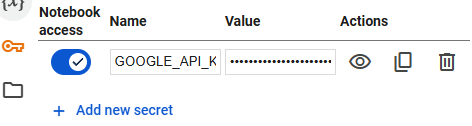

This notebook is set to read the secret called 'GOOGLE_API_KEY' but if you prefer to call it differently - no worries, just update the necessary field



Rest GOOGLE_API_KEY from secret. if you called your secret differently, or you decide not to use colab secrets - that's perfectly fine, just align the cell below:

In [1]:
from google.colab import userdata
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

In [2]:
# @title Let's make sure google-genai is available
!pip freeze | grep google-genai

google-genai==1.53.0


In [3]:
from google import genai
from google.genai import types

client = genai.Client(api_key=GOOGLE_API_KEY)

In [4]:
# @title Helper functions

import contextlib
import wave
from IPython.display import Audio
import json

file_index = 0

@contextlib.contextmanager
def wave_file(filename, channels=1, rate=24000, sample_width=2):
    with wave.open(filename, "wb") as wf:
        wf.setnchannels(channels)
        wf.setsampwidth(sample_width)
        wf.setframerate(rate)
        yield wf

def play_audio_blob(blob):
  global file_index
  file_index += 1

  fname = f'audio_{file_index}.wav'
  with wave_file(fname) as wav:
    wav.writeframes(blob.data)

  return Audio(fname, autoplay=True)

def play_audio(response):
    return play_audio_blob(response.candidates[0].content.parts[0].inline_data)

In [5]:
# @title let's choose the model

MODEL_ID = "gemini-2.5-flash-preview-tts" # @param ["gemini-2.5-flash-preview-tts","gemini-2.5-pro-preview-tts"] {"allow-input":true, isTemplate: true}

In [6]:
# @title OK - first example!

response = client.models.generate_content(
  model=MODEL_ID,
  contents="Say 'hello, is anybody out there? is there?'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)

In [7]:
# @title that's cool, but what if you want to use specific voice characterstics?

response = client.models.generate_content(
  model=MODEL_ID,
  contents="Say it in a much too happy, almost like a joker voice 'hello, is anybody out there? is there?'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)


In [8]:
response = client.models.generate_content(
  model=MODEL_ID,
  contents="Sing it 'hello, is anybody out there? is there?'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)

In [9]:
response = client.models.generate_content(
  model=MODEL_ID,
  contents="Say it 'hello [laugh], is anybody out there? [pause] hello? [annoyed groan] is there?'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)

In [11]:
# @title Multi language support!

response = client.models.generate_content(
  model=MODEL_ID,
  contents="قُل هذا: 'إزيّك [laugh]، إنت عارف إنّ ١،٢،٣،٤،٥ [pause for a second] أرقام؟'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)

In [14]:
response = client.models.generate_content(
  model=MODEL_ID,
  contents="imitate a voice of an older person, say it: 'hello [chuckle], is anybody out there? [pause] hello? [annoyed groan] is there?'",
  config={"response_modalities": ['Audio']},
)

play_audio(response)

In [15]:
# @title change the voice
# check out the voice samples here:
# https://docs.cloud.google.com/text-to-speech/docs/gemini-tts

voice_name = "Enceladus" # @param ["Zephyr", "Puck", "Charon", "Kore", "Fenrir", "Leda", "Orus", "Aoede", "Callirhoe", "Autonoe", "Enceladus", "Iapetus", "Umbriel", "Algieba", "Despina", "Erinome", "Algenib", "Rasalgethi", "Laomedeia", "Achernar", "Alnilam", "Schedar", "Gacrux", "Pulcherrima", "Achird", "Zubenelgenubi", "Vindemiatrix", "Sadachbia", "Sadaltager", "Sulafar"]

In [16]:
response = client.models.generate_content(
  model=MODEL_ID,
  contents="""
    say:
    "Have you seen my keys?! I cannot find them anywhere! We need to buy
    this.. this device that make sounds when you whistle, you know what I mean?"
  """,
  config={
      "response_modalities": ['Audio'],
      "speech_config": {
          "voice_config": {
              "prebuilt_voice_config": {
                  "voice_name": voice_name
              }
          }
      }
  },
)

play_audio(response)

In [17]:
# @title use two voices to create a conversation

our_config = types.GenerateContentConfig(
    response_modalities=["AUDIO"],
    speech_config=types.SpeechConfig(
        multi_speaker_voice_config=types.MultiSpeakerVoiceConfig(
            speaker_voice_configs=[
                types.SpeakerVoiceConfig(
                    speaker='Speaker1',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                            voice_name='Gacrux',
                        )
                    )
                ),
                types.SpeakerVoiceConfig(
                    speaker='Speaker2',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                            voice_name='Algenib',
                        )
                    )
                ),
            ]
        )
    )
)

response = client.models.generate_content(
  model=MODEL_ID,
  contents="""
    Make Speaker1 sound tired and bored, and Speaker2 sound excited and happy:

    Speaker1: So... what's on the agenda today?
    Speaker2: You're never going to guess!
    Speaker1: Oh now, what have you done? Don't you
    Speaker2: Yeah yeah, i know it's early, but
    Speaker1: Exactly. it's 8 am. You know the rules. no surprises
  """,
  config=our_config,
)

play_audio(response)

In [22]:
# @title you can even use LLM to generate a content of such conversation

transcript = client.models.generate_content(
    model='gemini-2.5-flash-lite',
    contents="""
      Generate a short (like 60-80 words) transcript that reads like
      it was clipped from a podcast of Adam and Anna talking about
      How great Devfest Cairo is with few short exchanges.
      Start by shortly describing two voices: Adam's and Anna's
      and then provide the transcript. Don't add any sounds description
    """
  ).text

print(transcript)

response = client.models.generate_content(
  model=MODEL_ID,
  contents=transcript,
  config={"response_modalities": ['Audio']},
)

play_audio(response)

Adam has a warm, enthusiastic voice, prone to excited interjections. Anna's voice is calm and measured, offering insightful commentary.

**Adam:** Anna, seriously, this DevFest Cairo is just incredible!

**Anna:** I agree, Adam. The energy here is palpable.

**Adam:** And the speakers! I just caught that talk on Flutter, mind-blowing!

**Anna:** They've really outdone themselves with the technical depth this year.

**Adam:** Totally! I'm learning so much. It’s the best yet.

**Anna:** Definitely a highlight of my year.


In [23]:
# @title let's try to cherry pick the proper voices

our_config = types.GenerateContentConfig(
    response_modalities=["AUDIO"],
    speech_config=types.SpeechConfig(
        multi_speaker_voice_config=types.MultiSpeakerVoiceConfig(
            speaker_voice_configs=[
                types.SpeakerVoiceConfig(
                    speaker='Anna',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                            voice_name='Gacrux',
                        )
                    )
                ),
                types.SpeakerVoiceConfig(
                    speaker='Adam',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                            voice_name='Algenib',
                        )
                    )
                ),
            ]
        )
    )
)

response = client.models.generate_content(
  model=MODEL_ID,
  contents=transcript,
  config=our_config
)

play_audio(response)

# Let's start building tools for "Audiobook" generation

In [24]:
# @title what voices can we choose from?

# the voice descriptions are based on https://www.reddit.com/r/Bard/comments/1kv4yew/all_gemini_voices_described_properly_by_gemini

voices = [
    {
        'name': 'Achernar',
        'sex': 'female',
        'description': 'Mid-aged - in her 20s - 30s, female, mid to high pitch, fairly calm.'
    },
    {
        'name': 'Achird',
        'sex': 'male',
        'description': 'Middle-aged, mid pitched male voice, clear with a slightly breathy.'
    },
    {
        'name': 'Algenib',
        'sex': 'male',
        'description': 'Warm, confident and slithly deep male voice, middle age to older person. '
    },
        {
        'name': 'Algenib',
        'sex': 'male',
        'description': 'Warm, confident and very deep male voice, middle age to older person. '
    },
    {
        'name': 'Alnilam',
        'sex': 'male',
        'description': 'Energetic male voice with a mid-to-low pitch, carrying a sense of excitement and clarity. Mid-age person.'
    },
    {
        'name': 'Aoede',
        'sex': 'female',
        'description': 'Clear, fairly high pitch, middle-age person. conversational female voice with a mid-range pitch and a thoughtful, engaging quality.'
    },
    {
        'name': 'Autonoe',
        'sex': 'female',
        'description': 'Mid age, calm female voice'
    },
    {
        'name': 'Callirrhoe',
        'sex': 'female',
        'description': 'Confident, clear female voice with a mid-range pitch, energetic, young adult voice.'
    },
    {
        'name': 'Charon',
        'sex': 'male',
        'description': 'Smooth, conversational male voice with a mid-to-low pitch, sounding assured and approachable. Carries a gentle authority and trustworthiness.'
    },
    {
        'name': 'Despina',
        'sex': 'female',
        'description': 'Young adult. Warm and inviting female voice with a clear, mid-range pitch. Sounds friendly, trustworthy, and engaging, with a pleasant smoothness. Best uses: Commercials (especially lifestyle/family), customer service recordings, welcoming narrations.'
    },
    {
        'name': 'Enceladus',
        'sex': 'male',
        'description': 'Energetic and enthusiastic older male voice with a mid-range pitch, perfect for conveying excitement. Clear and impactful delivery, with a slightly "promo" feel. Best uses: Promotional videos, event announcements, high-energy commercials.'
    },
    {
        'name': 'Erinome',
        'sex': 'female',
        'description': 'Professional and articulate younger female voice with a slightly lower mid-range pitch and a thoughtful, measured delivery. Conveys intelligence and composure, with a touch of sophistication. Best uses: Educational content, corporate narration, museum audio guides.'
    },
    {
        'name': 'Fenrir',
        'sex': 'male',
        'description': 'Friendly and clear younger male voice with a mid-range pitch, exhibiting a conversational and approachable style. Engaging and easy to listen to, with a natural delivery. Best uses: Explainer videos, podcasting, e-learning content.'
    },
    {
        'name': 'Gacrux',
        'sex': 'female',
        'description': 'Smooth, confident older female voice with a mid-to-low pitch and a clear, authoritative yet approachable tone.'
    },
    {
        'name': 'Iapetus',
        'sex': 'male',
        'description': 'Friendly, mid-pitched male voice with a casual, "everyman" quality.'
    },
    {
        'name': 'Kore',
        'sex': 'female',
        'description': 'Energetic and youthful female voice with a mid-to-high pitch, conveying confidence and enthusiasm. Clear and bright, with a perky, engaging quality. Best uses: Upbeat commercials, tutorials for a younger audience, animated character voice.'
    },
    {
        'name': 'Laomedeia',
        'sex': 'female',
        'description': 'Clear, conversational female voice with a mid-range pitch, possessing an inquisitive and engaging tone. Sounds friendly and intelligent, similar to Aoede but perhaps a touch more energetic. Best uses: E-learning, explainer videos, podcast hosting.'
    },
    {
        'name': 'Leda',
        'sex': 'female',
        'description': 'Composed and professional young female voice, mid-pitched with a slightly lower resonance, conveying authority and calm. Articulate and measured, with a sophisticated and trustworthy feel. Best uses: Corporate training, serious narration, formal announcements.'
    },
    {
        'name': 'Orus',
        'sex': 'male',
        'description': 'Mature male voice with a deeper, resonant quality, conveying thoughtfulness and experience. Calming and authoritative, with a measured, deliberate pace. Best uses: Documentary narration, audiobook (serious fiction/non-fiction), character voice (wise elder).'
    },
    {
        'name': 'Puck',
        'sex': 'male',
        'description': 'Clear and direct male voice with a mid-range pitch, sounding confident and approachable. Has a slightly informal, "guy next door" feel, trustworthy. Best uses: How-to videos, informal corporate communications, friendly product demos.'
    },
    {
        'name': 'Pulcherrima',
        'sex': 'female',
        'description': 'Bright, energetic female voice with a mid-to-low pitch.'
    },
    {
        'name': 'Rasalgethi',
        'sex': 'male',
        'description': 'Conversational male voice with a mid-range pitch and a slightly nasal, inquisitive quality. Approachable but distinct, with a thoughtful, questioning intonation. Best uses: Podcast discussions, character work (quirky), informal explainers.'
    },
    {
        'name': 'Sadachbia',
        'sex': 'male',
        'description': 'Deeper male voice with a slight rasp or texture, exuding confidence and a "cool," laid-back authority. Memorable and distinctive, with a touch of gravitas. Best uses: Movie trailers, edgy commercials, character voice (tough guy/rebel). Sounds like: A lighter Sam Elliott or a more conversational Jon Hamm.'
    },
    {
        'name': 'Sadaltager',
        'sex': 'male',
        'description': 'Friendly and enthusiastic male voice with a clear, mid-range pitch, well-suited for presentations. Engaging and professional, with good articulation. Best uses: Corporate presentations, training videos, webinar hosting.'
    },
    {
        'name': 'Schedar',
        'sex': 'male',
        'description': 'Friendly, mid-pitched male voice with an informal, approachable quality. Conveys a sense of being down-to-earth and relatable, easy to understand. Best uses: Casual tutorials, vlogs, friendly product explainers.'
    },
    {
        'name': 'Sulafat',
        'sex': 'female',
        'description': 'Warm, confident female voice with a clear mid-range pitch, sounding persuasive and articulate. Projects intelligence and friendliness, with an engaging presence. Best uses: Corporate narration, e-learning, persuasive marketing.'
    },
    {
        'name': 'Umbriel',
        'sex': 'male',
        'description': 'Smooth male voice with a mid-to-low pitch, conveying authority while remaining friendly and engaging. Excellent clarity for narration, with a trustworthy and knowledgeable tone. Best uses: Documentary narration, corporate storytelling, audiobook narration.'
    },
    {
        'name': 'Vindemiatrix',
        'sex': 'female',
        'description': 'Calm, older female. Thoughtful female voice with a mid-to-low pitch, sounding mature and composed. Conveys wisdom and a gentle authority, with a smooth, reassuring quality. Best uses: Meditation guides, narration for reflective content, mature character voices.'
    },
    {
        'name': 'Zephyr',
        'sex': 'female',
        'description': 'Energetic, young and bright female voice with a clear mid-range pitch, sounding perky and enthusiastic. Projects positivity and youthfulness, very engaging. Best uses: Upbeat commercials, children\'s content, friendly IVR.'
    },
    {
        'name': 'Zubenelgenubi',
        'sex': 'male',
        'description': 'Deep, resonant male voice conveying strong authority and seriousness. Commands attention with a powerful and measured delivery. Best uses: Movie trailers (epic), formal announcements, authoritative narration.'
    }
]

In [25]:
# @title OK, we have our voices, how to pick correct one?


def choose_voice(description, exclude=[]):
    """
    Choose the best matching voice based on a natural language description.

    Args:
        description: String describing desired voice (e.g., 'young female, energetic')
        exclude: List of voice names to exclude from selection

    Returns:
        String with the selected voice name
    """
    # Filter out excluded voices
    available_voices = [v for v in voices if v['name'] not in exclude]

    if not available_voices:
        return None

    # Build the voice list for the prompt
    voice_list = "\n".join([
        f"- {v['name']}: {v['sex']}, {v['description']}"
        for v in available_voices
    ])

    # Create prompt for Gemini
    prompt = f"""You are a voice selection expert. Based on the user's requirements, select the BEST matching voice from the list.

USER REQUIREMENTS: {description}

AVAILABLE VOICES:
{voice_list}

Return ONLY the voice name, nothing else. No explanation, no punctuation, just the name."""

    # Call Gemini
    response = client.models.generate_content(
        model="gemini-2.5-flash-lite",
        contents=prompt
    )

    # Extract and clean the response
    selected_voice = response.text.strip()

    return selected_voice

In [27]:
print(choose_voice('old male, energetic'))

Enceladus


In [29]:
# @title let's define 'ask llm' function

# note, this funciton allow us to ask for json_mode and even provide json_schema
# Read more about structured output https://ai.google.dev/gemini-api/docs/structured-output

def ask_llm(query, model_id="gemini-2.5-flash", json_mode=False, json_schema=None):
    """
    Query the LLM with optional JSON output.

    Args:
        query: The prompt text
        model_id: Model to use
        json_mode: If True, force JSON output
        json_schema: Optional dict defining the JSON structure

    Returns:
        String response (or JSON string if json_mode=True)
    """
    config = {}

    if json_mode:
        config["response_mime_type"] = "application/json"
        if json_schema:
            config["response_schema"] = json_schema

    response = client.models.generate_content(
        model=model_id,
        contents=query,
        config=config if config else None
    ).text

    return response

In [30]:
print(ask_llm(query='what day comes after friday?'))

Saturday


In [45]:
json_schema_1 = {
    "type": "object",
    "properties": {
        "day": {"type": "string"}
    },
    "required": ["day"]
}


result = ask_llm(query='what day comes after friday?',json_mode=True, json_schema=json_schema_1)


response = json.loads(result)
print(json.dumps(response, indent=2))


{
  "day": "Saturday"
}


In [46]:
json_schema_2 = {
    "type": "object",
    "properties": {
        "day_name": {"type": "string"},
        "day_index": {"type": "integer", "description": "0=Monday, 6=Sunday"},
        "reason": {"type": "string", "description": "justify the answer"}
    },
    "required": ["day_name"]
}

result = ask_llm(
    query="what day comes after Friday?",
    json_mode=True,
    json_schema=json_schema_2
)


response = json.loads(result)
print(json.dumps(response, indent=2))



{
  "day_name": "Saturday",
  "day_index": 5,
  "reason": "Saturday directly follows Friday in the weekly calendar."
}


In [47]:
# @title define 'say_it' function

def say_it(voice, instructions, text, model_id="gemini-2.5-flash-preview-tts"):
    """
    Generate speech using Gemini's TTS models.

    Args:
        voice: Voice name (e.g., "Kore")
        instructions: Voice characteristics and style instructions
        text: The actual text to speak
        model_id: The Gemini TTS model to use

    Returns:
        Response object from the API
    """
    prompt = f"""{instructions}\n"{text}" """

    response = client.models.generate_content(
        model=model_id,
        contents=prompt,
        config={
            "response_modalities": ['Audio'],
            "speech_config": {
                "voice_config": {
                    "prebuilt_voice_config": {
                        "voice_name": voice
                    }
                }
            }
        },
    )

    return response



In [48]:
response = say_it(
    voice="Kore",
    instructions="You are middle age woman with UK accent. Say it in a snarky tone:",
    text='Oh, fancy seeing you here! Hope you have a lovely day'
)

play_audio(response)

In [49]:
# @title Function to combine multiple responses into one audio file

def combine_audio(responses, output_filename='combined_audio.wav'):
    """
    Combine multiple TTS responses into one audio file.

    Args:
        responses: List of response objects from say_it()
        output_filename: Name of the output file

    Returns:
        Audio object for playback
    """
    with wave_file(output_filename) as wav:
        for response in responses:
            audio_data = response.candidates[0].content.parts[0].inline_data.data
            wav.writeframes(audio_data)

    return Audio(output_filename, autoplay=True)


In [50]:
# Usage:
responses = []
responses.append(say_it("Sadachbia", "say it in a deep narrator voice:", "Monday. 8 am. Fred wasn't particularly happy. He didn't enjoy monday mornings. He arrived at the office and was about to enter the room"))
print("checkpoint 0")
responses.append(say_it("Kore", "say it in happy voice:", "Hello Fred! Fancy seeing you here!"))
print("checkpoint 1")
responses.append(say_it("Sadachbia", "say it in a deep narrator voice:", "Anna welcomed Fred the moment he entered the room"))
print("checkpoint 2")
responses.append(say_it("Zubenelgenubi", "say it in calm voice:", "Oh, Hi Anna. yeah yeah.. same as yesterday!"))
print("checkpoint 3")
responses.append(say_it("Kore", "say it in happy voice:", "Nah silly, yesterday was"))
print("checkpoint 4")
responses.append(say_it("Zubenelgenubi", "say it in more energetic voice voice:", "Ah (sigh), right, it was sunday, wasn't it ?"))
print("checkpoint 5")
responses.append(say_it("Kore", "say it in happy voice:", "it sure was! (laugh)."))

combine_audio(responses, 'my_speech.wav')

checkpoint 0
checkpoint 1
checkpoint 2
checkpoint 3
checkpoint 4
checkpoint 5


In [51]:
# @title Let's generate those responses in parallel

from concurrent.futures import ThreadPoolExecutor
import time

def generate_all_parallel(script, model_id="gemini-2.5-flash-preview-tts", batch_size=9):
    """
    Generate all audio responses in parallel with rate limiting.

    Args:
        script: List of tuples (voice, instructions, text)
        model_id: TTS model to use
        batch_size: Max requests per batch (default 9 to stay under 10/min limit)

    Returns:
        List of responses in original order
    """
    def generate_one(args):
        voice, instructions, text = args
        print(f"sending request for:  {voice} : {text[:50]}...")
        generated = say_it(voice, instructions, text, model_id)
        print(f"finished:  {voice} : {text[:50]}...")
        return generated

    # Split script into batches
    batches = [script[i:i+batch_size] for i in range(0, len(script), batch_size)]

    all_responses = []
    overall_start = time.time()

    for batch_idx, batch in enumerate(batches):
        batch_start = time.time()
        print(f"\n=== Processing batch {batch_idx + 1}/{len(batches)} ({len(batch)} segments) ===")

        # Process batch in parallel
        with ThreadPoolExecutor(max_workers=5) as executor:
            batch_responses = list(executor.map(generate_one, batch))

        all_responses.extend(batch_responses)

        # Wait for rate limit if not the last batch
        if batch_idx < len(batches) - 1:
            elapsed = time.time() - batch_start
            wait_time = max(0, 60 - elapsed)
            if wait_time > 0:
                print(f"Rate limit: waiting {wait_time:.1f}s before next batch...")
                time.sleep(wait_time)

    total_time = time.time() - overall_start
    print(f"\n=== Generated {len(script)} clips in {total_time:.1f}s total ===")
    return all_responses

In [52]:
# @title Parallel usage example :
script = [
    ("Umbriel", "deep narrator voice:", "The door creaked open."),
    ("Kore", "cheerful voice:", "Good morning! (evil laugh). what a lovely start of a day!"),
    ("Zubenelgenubi", "tired voice:", "Is it really?"),
    ("Kore", "laughing:", "Oh come on! (cheerful sight) We have 8 hours of work ahead of us. let's at least start energetic. (burpes) Oups, sorry, too many energy drinks! (laugh)"),
]

responses = generate_all_parallel(script)
combine_audio(responses, 'parallel.wav')


=== Processing batch 1/1 (4 segments) ===
sending request for:  Umbriel : The door creaked open....
sending request for:  Kore : Good morning! (evil laugh). what a lovely start of...
sending request for:  Zubenelgenubi : Is it really?...
sending request for:  Kore : Oh come on! (cheerful sight) We have 8 hours of wo...
finished:  Zubenelgenubi : Is it really?...
finished:  Umbriel : The door creaked open....
finished:  Kore : Good morning! (evil laugh). what a lovely start of...
finished:  Kore : Oh come on! (cheerful sight) We have 8 hours of wo...

=== Generated 4 clips in 9.7s total ===


In [53]:
# @title Function to analyze the characters, find number of characters and assing them personas


def analyze_characters(story_text):
    """
    Analyze story to extract characters and narrator information.
    """

    prompt = f"""
Analyze this story and extract character information. Make educated guesses when information isn't explicit.

For the narrator:
- Determine if it's "third-person" (external observer) or name of the character (a character telling their own story)
- If first-person, identify WHICH character is the narrator by their name
- a short text description of a voice characteristics, including the fact that it's a narrator.

For each character (including the narrator if first-person):
- name: character's name
- description: a short text description of a voice characteristics - no longer than single sentence. including:
  * gender (make educated guess: "male", "female", or "unknown" if truly ambiguous)
  * age category (make educated guess: "child", "young adult", "middle-aged", "older adult", or as last resort altenrative "unknown")
  * personality traits, maybe specific accent?
  * emotional characteristics

Story:
{story_text}
"""

    # Define the schema
    schema = {
        "type": "object",
        "properties": {
            "narrator": {
                "type": "object",
                "properties": {
                    "type": {"type": "string"},
                    "description": {"type": "string"}
                }
            },
            "characters": {
                "type": "array",
                "items": {
                    "type": "object",
                    "properties": {
                        "name": {"type": "string"},
                        "description": {"type": "string"}
                    }
                }
            }
        }
    }

    response = ask_llm(prompt, json_mode=True, json_schema=schema)
    return json.loads(response)

In [54]:
# @title Let's test our analyze_characters function

# Test it:
test_story = """
Monday. 8 am. Fred wasn't particularly happy. He didn't enjoy monday mornings.
"Hello Fred! Fancy seeing you here!" Anna welcomed him cheerfully.
"Oh, Hi Anna. yeah yeah.. same as yesterday!" Fred replied tiredly.
"""

result = analyze_characters(test_story)
print(json.dumps(result, indent=2))

{
  "narrator": {
    "type": "third-person",
    "description": "A detached and objective narrator, observing the scene unfold."
  },
  "characters": [
    {
      "name": "Fred",
      "description": "Male, middle-aged, with a tired, somewhat grumpy voice, indicating a lack of enthusiasm."
    },
    {
      "name": "Anna",
      "description": "Female, young adult, with a cheerful and welcoming voice, expressing friendliness."
    }
  ]
}


In [55]:
test_story_first_person = """
I walked into the coffee shop, exhausted from my morning jog. My heart was still racing.
"Sarah! Over here!" Mike waved from the corner table, his laptop open as always.
I squeezed past the morning crowd. "Hey Mike, sorry I'm late."
"No worries," he grinned. "Lisa just texted - she's running even later. Client emergency."
I sighed and ordered my usual latte. Lisa was always dealing with some crisis. That's what you get for being the best lawyer in town, I suppose.
Twenty minutes later, Lisa burst through the door, phone still pressed to her ear, looking frazzled but somehow perfectly put together. Then she says:
"Hold on for a second. (pause and then whisper) Hi folks, I will be done in a second."
"""

result = analyze_characters(test_story_first_person)
print(json.dumps(result, indent=2))


{
  "narrator": {
    "type": "Sarah",
    "description": "A female young adult narrator, sounding slightly tired but friendly, with an observant and perhaps a bit wry tone."
  },
  "characters": [
    {
      "name": "Sarah",
      "description": "A female young adult, sounding slightly tired but friendly, with an observant and perhaps a bit wry tone."
    },
    {
      "name": "Mike",
      "description": "A male young adult, sounding casual and friendly, with an easygoing and perhaps slightly studious demeanor."
    },
    {
      "name": "Lisa",
      "description": "A female middle-aged, sounding professional and authoritative but currently frazzled, with a determined and efficient tone that can soften into politeness."
    }
  ]
}


In [ ]:
# @title Let's create function to assign_voices

# This funciton will take advantage of our `choose_voice` function we specified previously!

def assign_voices(character_analysis):
    """
    Assign voices to narrator and all characters.

    Args:
        character_analysis: Output dict from analyze_characters()

    Returns:
        dict mapping names to voice names, e.g.:
        {'narrator': 'Umbriel', 'Fred': 'Zubenelgenubi', 'Anna': 'Kore'}
    """
    narrator = character_analysis['narrator']
    characters = character_analysis['characters']

    voice_mapping = {}
    exclude = []

    # Check if narrator is one of the characters
    narrator_is_character = narrator['type'] != 'third-person'

    # Assign voices to all characters first
    for char in characters:
        voice = choose_voice(char['description'], exclude=exclude)
        voice_mapping[char['name']] = voice
        exclude.append(voice)

    # Assign narrator voice
    if narrator_is_character:
        # Narrator is a character - use same voice
        narrator_name = narrator['type']
        voice_mapping['narrator'] = voice_mapping[narrator_name]
    else:
        # Third-person narrator - assign separate voice
        voice = choose_voice(narrator['description'], exclude=exclude)
        voice_mapping['narrator'] = voice

    return voice_mapping


In [ ]:
char_analysis = analyze_characters(test_story_first_person)
selected_voices = assign_voices(char_analysis)
print(selected_voices)

{'Sarah': 'Callirrhoe', 'Mike': 'Fenrir', 'Lisa': 'Erinome', 'narrator': 'Callirrhoe'}


In [ ]:
# @title Function to segment the story

def segment_story(story_text, character_analysis):
    """
    Split story into segments attributed to narrator or characters.

    Args:
        story_text: Original story text
        character_analysis: Output from analyze_characters()

    Returns:
        List of dicts with 'speaker' and 'text' keys, e.g.:
        [
            {'speaker': 'narrator', 'text': 'The door creaked open.'},
            {'speaker': 'Anna', 'text': 'Good morning!'},
            ...
        ]
    """

    # Extract character names for the prompt
    char_names = [char['name'] for char in character_analysis['characters']]
    narrator_type = character_analysis['narrator']['type']

    prompt = f"""
Split this story into sequential segments. Each segment should be attributed to either the narrator or a speaking character.

Rules:
- Narration (descriptions, scene-setting, "he said", etc.) = 'narrator'
- Dialogue (actual spoken words) = character name who's speaking
- Preserve ALL content in order
- Keep each segment focused (one speaker at a time)

Available characters: {', '.join(char_names)}
Narrator type: {narrator_type}

Story:
{story_text}
"""

    schema = {
        "type": "object",
        "properties": {
            "segments": {
                "type": "array",
                "items": {
                    "type": "object",
                    "properties": {
                        "speaker": {"type": "string"},
                        "text": {"type": "string"}
                    }
                }
            }
        }
    }

    response = ask_llm(prompt, json_mode=True, json_schema=schema)
    result = json.loads(response)
    segments = result['segments']

    # Merge consecutive segments from same speaker
    if not segments:
        return segments

    merged = [segments[0].copy()]
    for seg in segments[1:]:
        if seg['speaker'] == merged[-1]['speaker']:
            merged[-1]['text'] += ' ' + seg['text']
        else:
            merged.append(seg.copy())

    return merged

In [ ]:
print("our current story:")
print(test_story_first_person)

char_analysis = analyze_characters(test_story_first_person)

segments = segment_story(test_story_first_person, char_analysis)
for seg in segments:
    print(f"{seg['speaker']}: {seg['text']}")

our current story:

I walked into the coffee shop, exhausted from my morning jog. My heart was still racing.
"Sarah! Over here!" Mike waved from the corner table, his laptop open as always.
I squeezed past the morning crowd. "Hey Mike, sorry I'm late."
"No worries," he grinned. "Lisa just texted - she's running even later. Client emergency."
I sighed and ordered my usual latte. Lisa was always dealing with some crisis. That's what you get for being the best lawyer in town, I suppose.
Twenty minutes later, Lisa burst through the door, phone still pressed to her ear, looking frazzled but somehow perfectly put together. Then she says:
"Hold on for a second. (pause and then whisper) Hi folks, I will be done in a second."

narrator: I walked into the coffee shop, exhausted from my morning jog. My heart was still racing.
Mike: Sarah! Over here!
narrator: Mike waved from the corner table, his laptop open as always. I squeezed past the morning crowd.
Sarah: Hey Mike, sorry I'm late.
Mike: No w

In [ ]:
# @title Let's define a function to build a script!

def build_script(segments, voice_mapping, character_analysis):
    """
    Build final script for TTS generation.

    Args:
        segments: List from segment_story()
        voice_mapping: Dict from assign_voices()
        character_analysis: Dict from analyze_characters()

    Returns:
        List of (voice, instructions, text) tuples
    """
    # Build description lookup
    descriptions = {}
    descriptions['narrator'] = character_analysis['narrator']['description']
    for char in character_analysis['characters']:
        descriptions[char['name']] = char['description']

    script = []
    for seg in segments:
        speaker = seg['speaker']
        voice = voice_mapping[speaker]
        instructions = f"say it as {descriptions[speaker]}"
        text = seg['text']

        script.append((voice, instructions, text))

    return script

In [ ]:
# @title And let's put it all together!

# Step 0: Our story:

print("=== OUR ORIGINAL STORY ===")
print(test_story_first_person)

# Step 1: Analyze characters
char_analysis = analyze_characters(test_story_first_person)
print("=== CHARACTER ANALYSIS ===")
print(json.dumps(char_analysis, indent=2))
print()

# Step 2: Assign voices
voice_mapping = assign_voices(char_analysis)
print("=== VOICE MAPPING ===")
print(voice_mapping)
print()

# Step 3: Segment story
segments = segment_story(test_story_first_person, char_analysis)
print("=== SEGMENTS ===")
for seg in segments:
    print(f"{seg['speaker']}: {seg['text']}")
print()

# Step 4: Build script
script = build_script(segments, voice_mapping, char_analysis)
print("=== FINAL SCRIPT ===")
for voice, instructions, text in script:
    print(f"Voice: {voice}")
    print(f"Instructions: {instructions}")
    print(f"Text: {text}")
    print()

# Step 5: Generate audio
print("=== GENERATING AUDIO ===")
responses = generate_all_parallel(script)
combine_audio(responses, 'parallel.wav')

=== OUR ORIGINAL STORY ===

I walked into the coffee shop, exhausted from my morning jog. My heart was still racing.
"Sarah! Over here!" Mike waved from the corner table, his laptop open as always.
I squeezed past the morning crowd. "Hey Mike, sorry I'm late."
"No worries," he grinned. "Lisa just texted - she's running even later. Client emergency."
I sighed and ordered my usual latte. Lisa was always dealing with some crisis. That's what you get for being the best lawyer in town, I suppose.
Twenty minutes later, Lisa burst through the door, phone still pressed to her ear, looking frazzled but somehow perfectly put together. Then she says:
"Hold on for a second. (pause and then whisper) Hi folks, I will be done in a second."

=== CHARACTER ANALYSIS ===
{
  "narrator": {
    "type": "Sarah",
    "description": "Sarah is the first-person narrator, a female young adult with a slightly breathless, apologetic, and reflective voice, often expressing fatigue or mild exasperation."
  },
  "cha